<img src="img/ims_logo.png" alt="Drawing" style="width: 130px;" align="left"/>

<div style="text-align: right">
<br>
<br>
<p style="font-size:16px;text-align: right"><b>Deep Learning Neural Networks: Group 14</b></p> <br>
<b>Authors:</b> Ana Filipa Silva - N20190866; André Estrela Pires - N20191411;<br> Hugo Virgilio Severino - N20190968; Tiago Paixao Domingues - N20190413
</div>

<br>

# Project: Jane Street Market Prediction

<br>

    1. Business and Data Understanding
        
    2. Data Preprocessing
    
        2.1 Import and Explore
        2.2 Verify Data Quality and Coherence
        2.3 Missing Values
        2.4 Outliers
        2.5 Correlation
        2.6 Data Cleaning
        2.7 Data Transformation
        2.8 Data Visualization
        2.9 Export to .csv
        
    3. Modelling
    
    4. Compare and Evaluate Models

    5. Conclusions

## 1. Business and Data Understanding

Lorem ipsum dolor sit amet, consectetur adipiscing elit. Donec aliquam elit sem, et posuere enim consectetur ac. Nam vitae risus eu tellus iaculis venenatis a ac lorem. Integer id elementum risus. Maecenas ipsum elit, sodales vel porttitor quis, condimentum ut magna. Morbi mollis et risus quis semper. Donec at odio massa. Nam nec elit a libero euismod fermentum eu sed nunc. Proin ex diam, tincidunt non nisl non, mattis fringilla erat. Nam interdum sapien quam, eu pharetra erat pellentesque ac. Nunc elementum ac lorem a viverra. Proin elit turpis, consequat imperdiet velit non, rutrum sagittis turpis. Donec at felis velit. Phasellus rhoncus libero sed elit luctus, sed euismod nisl vehicula. Aliquam nec nisl in nibh posuere scelerisque ac ac quam. Sed rutrum nisi sodales, malesuada odio ac, tempor ipsum.

## 2. Data Preprocessing
This section shows the steps we made in the preprocessing of our data. We are going to start by **importing and exploring** our dataset. Then we will **verify the data quality and coherence**, as well as describe all **data cleaning** steps performed to deal with missing values and outliers. We are also going to pursue some necessary **data transformations** to our dataset. Finally, we will make an intuitive **data visualization** assessment to shed further light into the next modelling phase.

Note that the preprocessing steps applied in this second part of the project are slightly different from the previous clustering exercise. Even so, all procedures carried out in this part of the project are adequately described below.

### 2.1 Import and Explore

In this section we will import the Jane Street Market dataset and explore basic characteristics of the data so that we are able to make the best decisions in the data cleaning and transformation steps.

__`Step 1`__ Import libraries

In [1]:
import sys
import pandas as pd
import numpy as np
import scipy as sp
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import os
import warnings

warnings.filterwarnings('ignore')

from os import listdir
import webbrowser
import requests
import missingno as msn
import plotly.express as px

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import EarlyStopping

__`Step 2`__ Load dataset

In [2]:
jane = pd.read_csv('./train.csv') #, nrows = 100000)

__`Step 3`__ Explore our dataset

In [3]:
#Checking memory usage
start_mem = jane.memory_usage().sum() / 1024**2 
print('Mem. usage is {:5.2f} Mb '.format(start_mem))

Mem. usage is 2516.84 Mb 


In [4]:
#Checking data types
jane.dtypes 

date             int64
weight         float64
resp_1         float64
resp_2         float64
resp_3         float64
                ...   
feature_126    float64
feature_127    float64
feature_128    float64
feature_129    float64
ts_id            int64
Length: 138, dtype: object

In [5]:
#Checking columns/rows
row=jane.shape[0]
columns=jane.shape[1]
days=jane['date'].nunique()
print(jane.shape)
print('- The dataset include {} rows/records and {} columns.'.format(row,columns ))
print('- The time series has {} days.'.format(days)) 

(2390491, 138)
- The dataset include 2390491 rows/records and 138 columns.
- The time series has 500 days.


In [6]:
#Checking features
print(jane.columns)

Index(['date', 'weight', 'resp_1', 'resp_2', 'resp_3', 'resp_4', 'resp',
       'feature_0', 'feature_1', 'feature_2',
       ...
       'feature_121', 'feature_122', 'feature_123', 'feature_124',
       'feature_125', 'feature_126', 'feature_127', 'feature_128',
       'feature_129', 'ts_id'],
      dtype='object', length=138)


In [7]:
jane.sort_values(by= ['date','ts_id'],inplace=True)
jane.head()

,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,...,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id
0,0,0.000000,0.009916,0.014079,0.008773,0.001390,0.006270,1,-1.872746,-2.191242,...,NaN,1.168391,8.313583,1.782433,14.018213,2.653056,12.600292,2.301488,11.445807,0
1,0,16.673515,-0.002828,-0.003226,-0.007319,-0.011114,-0.009792,-1,-1.349537,-1.704709,...,NaN,-1.178850,1.777472,-0.915458,2.831612,-1.417010,2.297459,-1.304614,1.898684,1
2,0,0.000000,0.025134,0.027607,0.033406,0.034380,0.023970,-1,0.812780,-0.256156,...,NaN,6.115747,9.667908,5.542871,11.671595,7.281757,10.060014,6.638248,9.427299,2
3,0,0.000000,-0.004730,-0.003273,-0.000461,-0.000476,-0.003200,-1,1.174378,0.344640,...,NaN,2.838853,0.499251,3.033732,1.513488,4.397532,1.266037,3.856384,1.013469,3
4,0,0.138531,0.001252,0.002165,-0.001215,-0.006219,-0.002604,1,-3.172026,-3.093182,...,NaN,0.344850,4.101145,0.614252,6.623456,0.800129,5.233243,0.362636,3.926633,4


### 2.2 Verify Data Quality and Coherence

In this section we are going to assess data quality and check overall coherence.

__`Step 1`__ Check data coherence

In [8]:
# Check overall data coherence
pd.DataFrame(jane.describe(include='all'))

,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,...,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id
count,2.390491e+06,2.390491e+06,2.390491e+06,2.390491e+06,2.390491e+06,2.390491e+06,2.390491e+06,2.390491e+06,2.390491e+06,2.390491e+06,...,2.320637e+06,2.390268e+06,2.390268e+06,2.374408e+06,2.374408e+06,2.381638e+06,2.381638e+06,2.388570e+06,2.388570e+06,2.390491e+06
mean,2.478668e+02,3.031535e+00,1.434969e-04,1.980749e-04,2.824183e-04,4.350201e-04,4.083113e-04,9.838565e-03,3.855776e-01,3.576875e-01,...,2.687757e-01,3.435523e-01,2.799973e-01,3.351537e-01,2.448752e-01,3.391778e-01,2.323809e-01,3.425608e-01,2.456182e-01,1.195245e+06
std,1.522746e+02,7.672794e+00,8.930163e-03,1.230236e-02,1.906882e-02,3.291224e-02,2.693609e-02,9.999518e-01,2.559373e+00,2.477335e+00,...,2.174238e+00,2.087842e+00,1.977643e+00,1.742587e+00,2.242853e+00,2.534498e+00,1.795854e+00,2.307130e+00,1.765419e+00,6.900755e+05
min,0.000000e+00,0.000000e+00,-3.675043e-01,-5.328334e-01,-5.681196e-01,-5.987447e-01,-5.493845e-01,-1.000000e+00,-3.172026e+00,-3.093182e+00,...,-7.471971e+00,-5.862979e+00,-6.029281e+00,-4.080720e+00,-8.136407e+00,-8.215050e+00,-5.765982e+00,-7.024909e+00,-5.282181e+00,0.000000e+00
25%,1.040000e+02,1.617400e-01,-1.859162e-03,-2.655044e-03,-5.030704e-03,-9.310415e-03,-7.157903e-03,-1.000000e+00,-1.299334e+00,-1.263628e+00,...,-1.123252e+00,-1.114326e+00,-9.512009e-01,-9.133750e-01,-1.212124e+00,-1.452912e+00,-8.993050e-01,-1.278341e+00,-8.544535e-01,5.976225e+05
50%,2.540000e+02,7.086770e-01,4.552665e-05,6.928179e-05,1.164734e-04,1.222579e-04,8.634997e-05,1.000000e+00,-1.870182e-05,-7.200577e-07,...,0.000000e+00,7.006233e-17,6.054629e-17,4.870826e-17,-2.558675e-16,1.015055e-16,5.419920e-17,8.563069e-17,4.869529e-17,1.195245e+06
75%,3.820000e+02,2.471791e+00,2.097469e-03,2.939111e-03,5.466336e-03,9.804649e-03,7.544347e-03,1.000000e+00,1.578417e+00,1.526399e+00,...,1.342829e+00,1.405926e+00,1.308625e+00,1.228277e+00,1.409687e+00,1.767275e+00,1.111491e+00,1.582633e+00,1.125321e+00,1.792868e+06
max,4.990000e+02,1.672937e+02,2.453477e-01,2.949339e-01,3.265597e-01,5.113795e-01,4.484616e-01,1.000000e+00,7.442989e+01,1.480763e+02,...,1.107771e+02,4.812516e+01,1.276908e+02,6.514517e+01,7.052807e+01,5.872849e+01,6.932221e+01,5.119038e+01,1.164568e+02,2.390490e+06


### 2.3 Missing Values

In this section we are going to explore missing values.

__`Step 1`__ Explore missing values

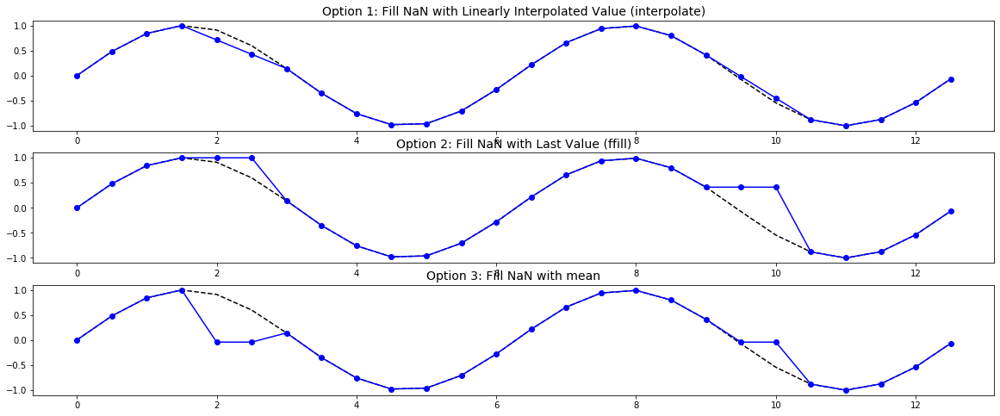

In [9]:
#.interpolate() 

f, ax = plt.subplots(nrows=3, ncols=1, figsize=(20,8))

time = np.arange(0, 13, 0.5)
amplitude = np.sin(time)
amplitude_missing = np.array([ 0. ,  0.47942554,  0.84147098,  0.99749499,  np.nan,  np.nan,  0.14112001, -0.35078323, -0.7568025 , -0.97753012,
                              -0.95892427, -0.70554033, -0.2794155 ,  0.21511999,  0.6569866 , 0.93799998,  0.98935825,  0.79848711,  0.41211849, 
                              np.nan, np.nan, -0.87969576, -0.99999021, -0.87545217, -0.53657292, -0.0663219 ])

ax[0].plot(time, amplitude, '--', color='k')
ax[0].plot(time, pd.Series(amplitude_missing).interpolate(), '-o', color='b')
ax[0].set_title('Option 1: Fill NaN with Linearly Interpolated Value (interpolate)', fontsize=14)

ax[1].plot(time, amplitude, '--', color='k')
ax[1].plot(time, pd.Series(amplitude_missing).ffill(), '-o', color='b')
ax[1].set_title('Option 2: Fill NaN with Last Value (ffill)', fontsize=14)

ax[2].plot(time, amplitude, '--', color='k')
ax[2].plot(time, pd.Series(amplitude_missing).fillna(pd.Series(amplitude_missing).mean()), '-o', color='b')
ax[2].set_title('Option 3: Fill NaN with mean', fontsize=14)

plt.show()

**Option 1:** Fill NaN with Linearly Interpolated Value with .interpolate()

Filling NaNs with the interpolated values is the best option in this small examlple but it requires knowledge of the neighouring values. This could be not feasible for this challenge.

**Option 2:** Fill NaN with Last Value with .ffill()

Filling NaNs with the last value is already a little bit better in this case.

**Option 3:** Fill NaN with Mean Value

Also in this example, we can see that filling NaNs with the mean value is also not sufficient.

In [10]:
#Visualize missing values
fig = px.bar(x = jane.isnull().sum().index,y= jane.isnull().sum().values,title= 'Number of Null values')
fig.layout.xaxis.tickangle = 300
fig.layout.xaxis. dtick = 5
fig.layout.yaxis. dtick = 100000
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = ''
fig.layout.xaxis.showgrid = True
fig.show()

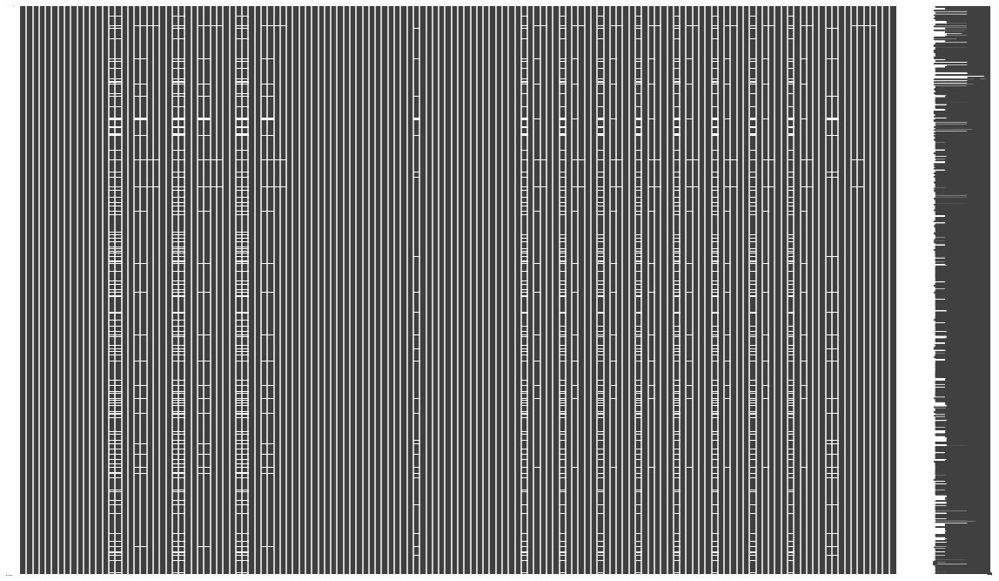

In [11]:
#Visualize missing values
msn.matrix(jane, figsize=(20,12), fontsize=2);

In [12]:
#check missing values > row*0.03

def missing_values_reporter(df):    
    na_count = df.isna().sum(axis=None) 
    ser = na_count[na_count > row*0.03]
    ser_p = np.round(ser.divide(df.shape[0])*100,2)
    tmp = pd.DataFrame({"N missings": ser,"% missings": ser_p,"Above Threshold (3%)": False})
    tmp.loc[tmp["% missings"] > 3., 'Above Threshold (3%)'] = 'True' 
    tmp.sort_values(by = '% missings', ascending = False, inplace = True)
    return tmp

missing_values_reporter(jane)

,N missings,% missings,Above Threshold (3%)
feature_17,395535,16.55,True
feature_18,395535,16.55,True
feature_27,395535,16.55,True
feature_28,395535,16.55,True
feature_7,393135,16.45,True
feature_8,393135,16.45,True
feature_78,351426,14.70,True
feature_108,351426,14.70,True
feature_102,351426,14.70,True
feature_96,351426,14.70,True


### 2.4 Outliers
In this section we are going to explore outliers.

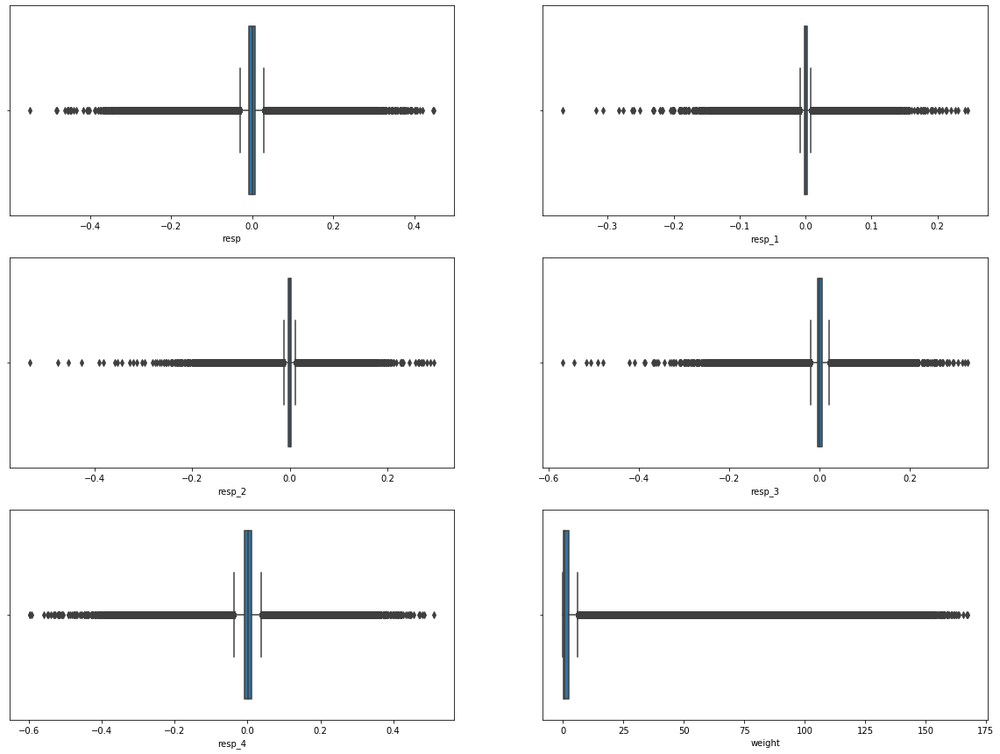

In [13]:
## Explore outliers
q_low = jane.quantile(.25)
q_high = jane.quantile(.75)
iqr = q_high - q_low 
iqr

outliers = ((jane.iloc[:, :7] < (q_low - 1.5 * iqr)) | (jane.iloc[:, :7] > (q_high + 1.5 * iqr))).sum()

outliers=outliers[outliers>0]

%matplotlib inline

var_outliers =outliers.index
fig, axes =plt.subplots(3,2,figsize=(20,15))

r=0
c=0
for var in var_outliers:
    if(c==2):
        c=0
        r=r+1
    sns.boxplot(jane[var], orient='h',ax=axes[r][c])
    c=c+1

In [14]:
#Checking Max Values
fig = px.bar(jane.iloc[:, 7:137].max(), title='Features Max Values')
fig.layout.xaxis.tickangle = 300
fig.update_traces(showlegend = False)
fig.layout.xaxis. dtick = 5
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = ''
fig.show()

In [15]:
#Checking Min Values
fig = px.bar(jane.iloc[:, 7:137].min(), title='Features Min Values')
fig.layout.xaxis.tickangle = 300
fig.update_traces(showlegend = False)
fig.layout.xaxis. dtick = 5
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = ''
fig.show()

### 2.5 Correlation

In this section, we present different correlation measures.

__`Step 1`__ Features Correlations

Text(0.5, 1, 'Correlation between Feature')

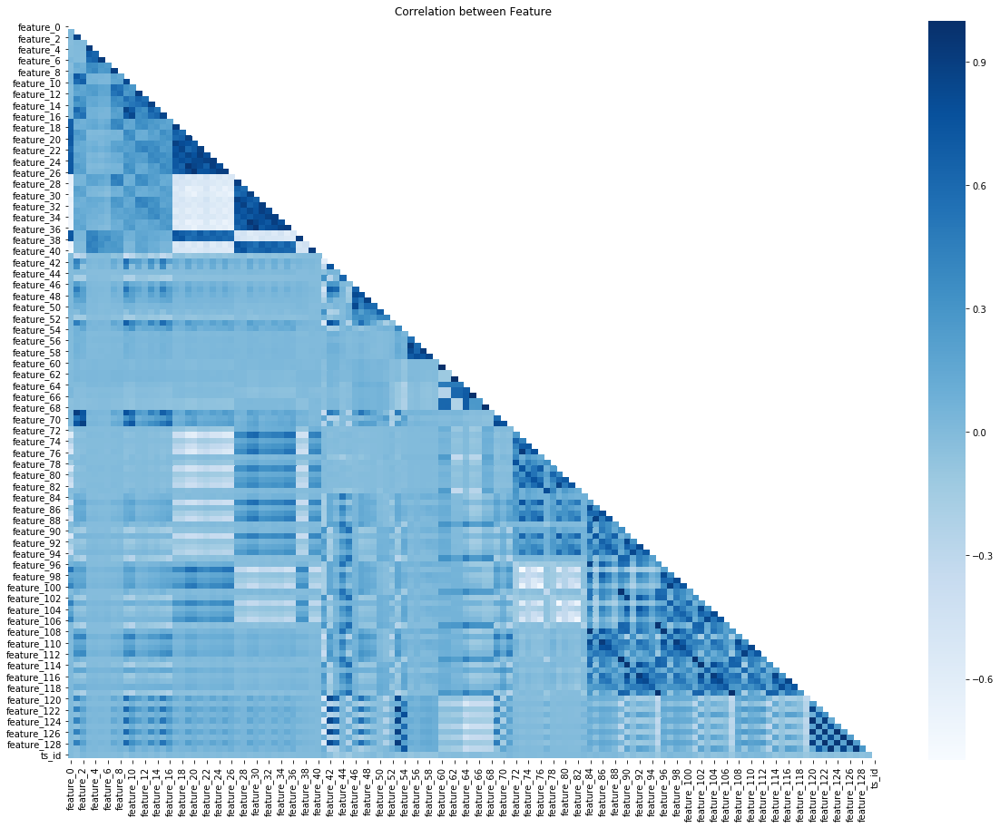

In [16]:
# Calculate correlations between variables using spearman method

corr = jane.iloc[:, 7:138].corr(method ='pearson')
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Plot
figure = plt.figure(figsize=(20,15))
ax = plt.axes()
sns.heatmap(corr , mask=mask , fmt = '.1g', cmap = 'Blues')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
ax.set_title('Correlation between Feature')

In [17]:
#Check features correlation matrix
(jane.iloc[:, 7:138].corr(method ='pearson')
    .style
    .background_gradient(cmap='viridis'))

Text(0.5, 1, 'Correlation between Feature')

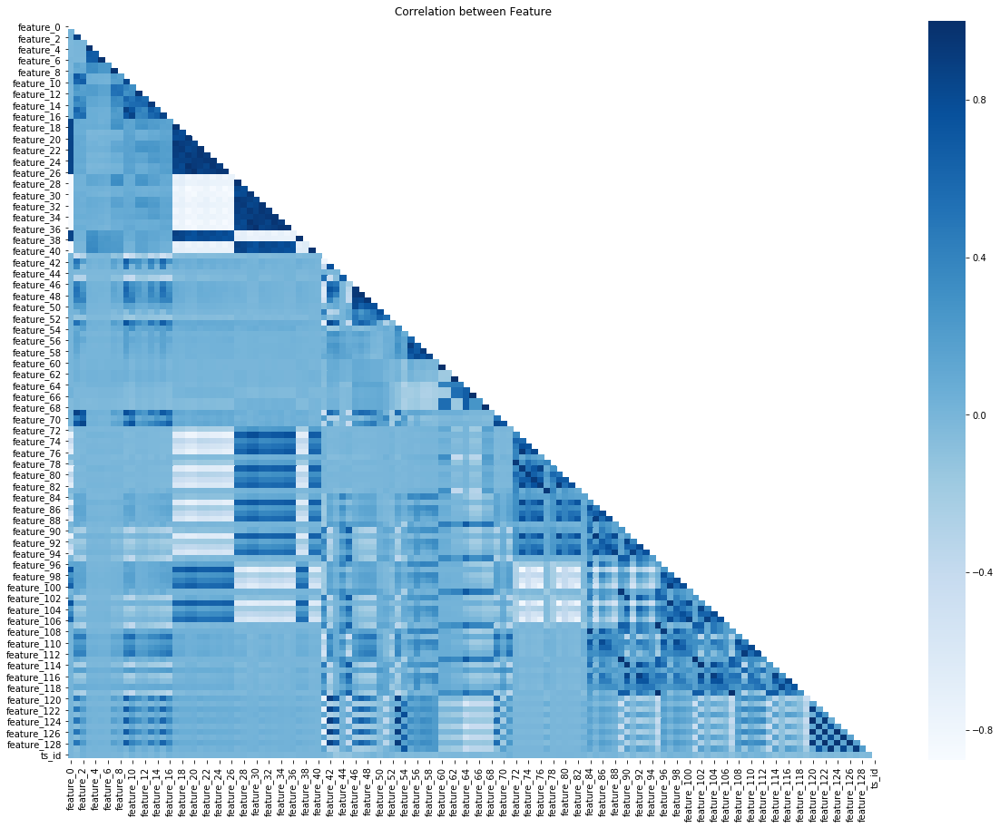

In [18]:
# Calculate correlations between variables using spearman method
corr = jane.iloc[:, 7:138].corr(method ='spearman')
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Plot
figure = plt.figure(figsize=(20,15))
ax = plt.axes()
sns.heatmap(corr , mask=mask , fmt = '.1g', cmap = 'Blues')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
ax.set_title('Correlation between Feature')

In [19]:
#Check features correlation matrix
(jane.iloc[:, 7:138].corr(method ='spearman')
    .style
    .background_gradient(cmap='viridis'))

In [20]:
#sns.pairplot(jane,vars=to_drop, diag_kind="kde")

__`Step 2`__ Weight and Response Correlations

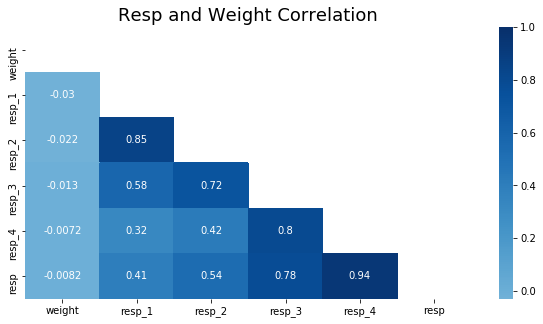

In [21]:
#Weight and Response matrix
plt.subplots(figsize=(10, 5))

matrix = np.triu(jane.iloc[:, 1:7].corr(method ='spearman'))

c = sns.heatmap(jane.iloc[:, 1:7].corr(method ='spearman'), annot = True, center = 0, cmap = 'Blues', mask = matrix)
c.set_title("Resp and Weight Correlation", fontsize=18)

plt.show()

In [22]:
#Correlation
feature_name = [i for i in jane.columns[7:-2]]
weight_corr = [[i,round(jane.weight.corr(jane[i]),2)] for i in feature_name]

def findMax (weight_corr):
    numbers = []
    for i in weight_corr:
        numbers.append(i[1])
    return weight_corr[numbers.index(max(numbers))]

In [23]:
findMax(weight_corr)

['feature_51', 0.54]

Text(0.5, 1.0, 'Correlation F_51 with Weight')

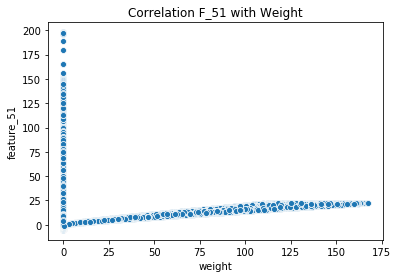

In [24]:
sns.scatterplot(y = 'feature_51', x = 'weight', data = jane).set_title("Correlation F_51 with Weight")

### 2.6 Data Cleaning

In this section we present our data cleaning steps.

In [25]:
jane_1 = jane.copy() #checkpoint
print(jane_1.shape)
jane_1.head()

(2390491, 138)


,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,...,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id
0,0,0.000000,0.009916,0.014079,0.008773,0.001390,0.006270,1,-1.872746,-2.191242,...,NaN,1.168391,8.313583,1.782433,14.018213,2.653056,12.600292,2.301488,11.445807,0
1,0,16.673515,-0.002828,-0.003226,-0.007319,-0.011114,-0.009792,-1,-1.349537,-1.704709,...,NaN,-1.178850,1.777472,-0.915458,2.831612,-1.417010,2.297459,-1.304614,1.898684,1
2,0,0.000000,0.025134,0.027607,0.033406,0.034380,0.023970,-1,0.812780,-0.256156,...,NaN,6.115747,9.667908,5.542871,11.671595,7.281757,10.060014,6.638248,9.427299,2
3,0,0.000000,-0.004730,-0.003273,-0.000461,-0.000476,-0.003200,-1,1.174378,0.344640,...,NaN,2.838853,0.499251,3.033732,1.513488,4.397532,1.266037,3.856384,1.013469,3
4,0,0.138531,0.001252,0.002165,-0.001215,-0.006219,-0.002604,1,-3.172026,-3.093182,...,NaN,0.344850,4.101145,0.614252,6.623456,0.800129,5.233243,0.362636,3.926633,4


__`Step 1`__ Missing Values

In [26]:
#
na_count = jane_1.isna().sum(axis=None)
ser = na_count[na_count > row*0.03]
feat_todrop = ser.index.values.tolist()

print(feat_todrop)

#drop missings
jane_1 = jane_1.drop(feat_todrop,axis=1 )

['feature_7', 'feature_8', 'feature_11', 'feature_12', 'feature_17', 'feature_18', 'feature_21', 'feature_22', 'feature_27', 'feature_28', 'feature_31', 'feature_32', 'feature_72', 'feature_78', 'feature_84', 'feature_90', 'feature_96', 'feature_102', 'feature_108', 'feature_114']


In [27]:
print(jane.shape)
print(jane_1.shape)

(2390491, 138)
(2390491, 118)


In [28]:
#fill initial NA with ffill
remain_na=[col for col in list(jane_1.columns) if jane_1[col].isnull().any()]
print(remain_na)

#Use .ffill method and drop the reamin NA values
jane_1 = jane_1.fillna(method='ffill')

['feature_3', 'feature_4', 'feature_9', 'feature_10', 'feature_13', 'feature_14', 'feature_15', 'feature_16', 'feature_19', 'feature_20', 'feature_23', 'feature_24', 'feature_25', 'feature_26', 'feature_29', 'feature_30', 'feature_33', 'feature_34', 'feature_35', 'feature_36', 'feature_44', 'feature_45', 'feature_55', 'feature_56', 'feature_58', 'feature_59', 'feature_73', 'feature_74', 'feature_75', 'feature_76', 'feature_79', 'feature_80', 'feature_81', 'feature_82', 'feature_85', 'feature_86', 'feature_87', 'feature_88', 'feature_91', 'feature_92', 'feature_93', 'feature_94', 'feature_97', 'feature_98', 'feature_99', 'feature_100', 'feature_103', 'feature_104', 'feature_105', 'feature_106', 'feature_109', 'feature_110', 'feature_111', 'feature_112', 'feature_115', 'feature_116', 'feature_117', 'feature_118', 'feature_120', 'feature_121', 'feature_122', 'feature_123', 'feature_124', 'feature_125', 'feature_126', 'feature_127', 'feature_128', 'feature_129']


In [29]:
# fill remaining NA with mean
remain_na=[col for col in list(jane_1.columns) if jane_1[col].isnull().any()]
print(remain_na)

# For the remain values we will use the mean of the specified column
for i in remain_na:
    jane_1[i].fillna( jane_1[i].mean(),inplace=True)

['feature_55', 'feature_74', 'feature_80', 'feature_86', 'feature_92', 'feature_98', 'feature_104', 'feature_110', 'feature_116', 'feature_120', 'feature_121']


In [30]:
jane_1.isnull().sum()

date           0
weight         0
resp_1         0
resp_2         0
resp_3         0
              ..
feature_126    0
feature_127    0
feature_128    0
feature_129    0
ts_id          0
Length: 118, dtype: int64

__`Step 2`__ Correlation

In [31]:
# Create correlation matrix
corr_matrix = jane_1.iloc[:, 7:138].corr(method='spearman').abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

print(to_drop)

['feature_2', 'feature_4', 'feature_6', 'feature_10', 'feature_14', 'feature_15', 'feature_16', 'feature_19', 'feature_20', 'feature_23', 'feature_24', 'feature_25', 'feature_26', 'feature_29', 'feature_30', 'feature_33', 'feature_34', 'feature_35', 'feature_36', 'feature_37', 'feature_38', 'feature_39', 'feature_40', 'feature_47', 'feature_48', 'feature_49', 'feature_50', 'feature_53', 'feature_57', 'feature_58', 'feature_59', 'feature_61', 'feature_63', 'feature_66', 'feature_68', 'feature_69', 'feature_71', 'feature_76', 'feature_79', 'feature_80', 'feature_81', 'feature_82', 'feature_83', 'feature_85', 'feature_88', 'feature_91', 'feature_93', 'feature_94', 'feature_97', 'feature_100', 'feature_101', 'feature_103', 'feature_105', 'feature_106', 'feature_107', 'feature_110', 'feature_111', 'feature_112', 'feature_113', 'feature_116', 'feature_117', 'feature_118', 'feature_119', 'feature_120', 'feature_122', 'feature_124', 'feature_125', 'feature_126', 'feature_127', 'feature_128', '

In [32]:
# Drop features 
jane_1.drop(to_drop, axis=1, inplace=True)

In [33]:
print(jane.shape)
print(jane_1.shape)

(2390491, 138)
(2390491, 47)


__`Step 3`__ Weight=0

In [34]:
jane_2 = jane_1.copy() #checkpoint
print(jane_1.shape)
jane_2.shape

(2390491, 47)


(2390491, 47)

Text(0, 0.5, '')

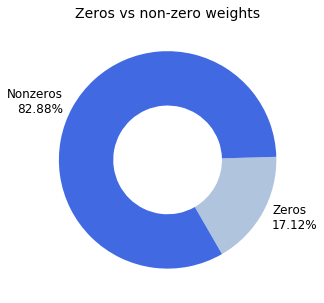

In [35]:
pie, ax = plt.subplots(figsize=(5,5))

ax.pie(((jane_2.weight==0).mean(),(1-(jane_2.weight==0).mean())),startangle=300,wedgeprops=dict(width=0.5),
        labels=('Zeros\n{}%'.format(round((jane_2.weight==0).mean()*100,2)),'Nonzeros\n{}%'.format(round((1-(jane_2.weight==0).mean())*100,2))),
        textprops={'fontsize': 12}, colors=['lightsteelblue', 'royalblue'])

ax.set_title('Zeros vs non-zero weights',fontsize=14)


ax.set_ylabel('')

In [36]:
jane_2 = jane_2[jane_2.weight != 0]

In [37]:
jane_2.shape

(1981287, 47)

In [38]:
jane_2.weight.value_counts()

0.410551     1
28.210170    1
2.737599     1
9.890265     1
0.270441     1
            ..
23.874268    1
20.966196    1
2.076336     1
2.674770     1
4.209909     1
Name: weight, Length: 1981287, dtype: int64

In [39]:
print(jane.shape)
print(jane_1.shape)
print(jane_2.shape)

(2390491, 138)
(2390491, 47)
(1981287, 47)


### 2.7 Data Transofrmation

In this section we will import the Jane Street Market dataset and explore basic characteristics of the data so that we are able to make the best decisions in the data cleaning and transformation steps.

In [40]:
#jane = jane.query('weight > 0').reset_index(drop = True)
jane_2['we_resp'] = jane_2['weight'] * (jane_2['resp_3'])

In [41]:
jane_2['target'] = np.where(jane_2['we_resp'] > 0, 1,0)
jane_2.target = jane_2.target.astype('category')

1    1006031
0     975256
Name: target, dtype: int64


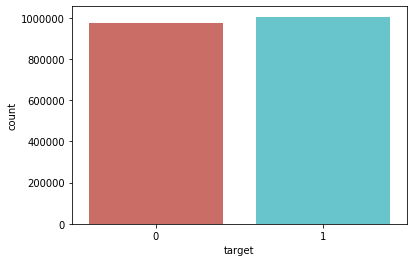

In [42]:
sns.countplot(x=jane_2['target'],palette="hls")
print(jane_2.target.value_counts())

### 2.8 Data Visualization

__`Step 1`__ Visualizing variables

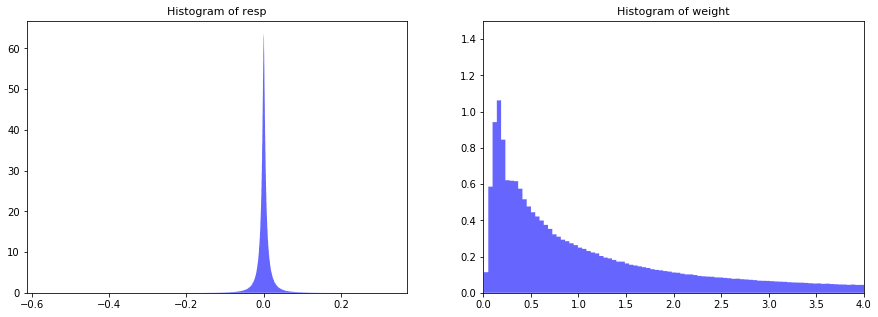

In [43]:
#
fig, ax = plt.subplots(1,2,figsize=(15,5))

ax[0].hist( jane_2['resp_3'], bins='auto', density=True, histtype='stepfilled',align="mid",
            color="blue", alpha=0.6, rwidth=15)

ax[1].hist( jane_2['weight'], bins='auto', density=True, histtype='stepfilled',align="mid",
            color="blue", alpha=0.6, rwidth=15)

ax[0].set_title('Histogram of resp', size=11)
ax[1].set_title("Histogram of weight", size=11)

plt.xlim(0,4)

plt.ylim(0,1.5)

plt.show()

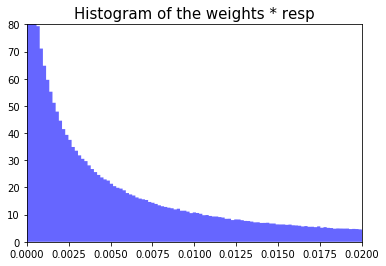

In [44]:
#
fig, ax = plt.subplots()

n, bins, patches = plt.hist(jane_2['we_resp'], bins='auto', density=True, histtype='stepfilled',align="mid",
                            color="blue", alpha=0.6, rwidth=15)
   
plt.xlim(0,0.02)
plt.ylim(0,80)

ax.set_title("Histogram of the weights * resp", size=15)

plt.show()

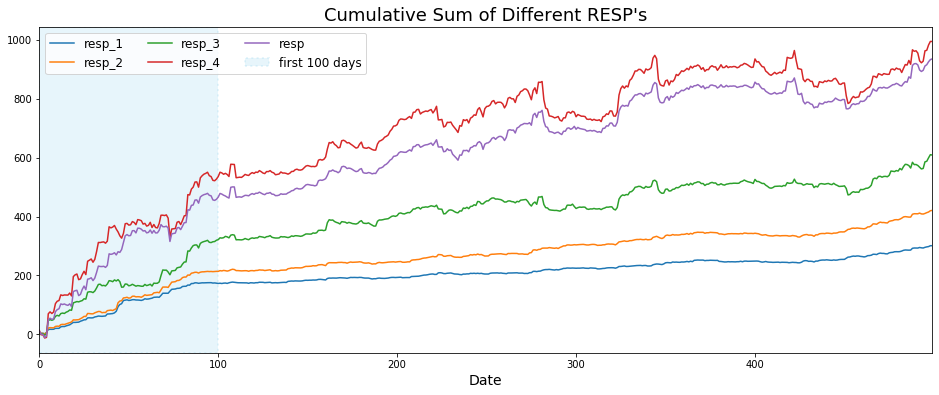

In [45]:
#
fig = plt.figure(figsize=(16,6))
ax = plt.subplot(1,1,1)
jane_2.groupby('date')[['resp_1', 'resp_2', 'resp_3', 'resp_4', 'resp']].sum().cumsum().plot(ax=ax)
plt.title('Cumulative Sum of Different RESP\'s',fontsize=18)
plt.xlabel('Date',fontsize=14)
plt.axvspan(0,100,linestyle=':',linewidth=2,label='first 100 days',color='skyblue',alpha=.2)
plt.legend(fontsize=12,ncol=3,loc=2);

In [46]:
#
fig = px.area(data_frame= jane_2.groupby('date')[['resp_3']].count(),title='Number of operation per day')
fig.update_traces( showlegend = False)
fig.layout.xaxis.title = 'Day' 
fig.layout.yaxis.title = 'Number of operations'
fig.show()

In [47]:
#
fig = px.area(data_frame= jane_1.groupby('date')[['resp_3']].sum(),title='Resp sum of operation per day')
fig.update_traces( showlegend = False)
fig.layout.xaxis.title = 'Day' 
fig.layout.yaxis.title = 'Resp sum'
fig.show()

### 2.8 Export to .csv

In [48]:
jane_3 = jane_2.drop(['weight', 'resp', 'resp_1', 'resp_2', 'resp_4', 'we_resp'], axis=1)

In [49]:
print(jane.shape)
print(jane_1.shape)
print(jane_2.shape)
print(jane_3.shape)
jane_3.head()

(2390491, 138)
(2390491, 47)
(1981287, 49)
(1981287, 43)


,date,resp_3,feature_0,feature_1,feature_3,feature_5,feature_9,feature_13,feature_41,feature_42,...,feature_95,feature_98,feature_99,feature_104,feature_109,feature_115,feature_121,feature_123,ts_id,target
1,0,-0.007319,-1,-1.349537,0.068058,0.193794,-0.151877,1.225838,5.711996,-2.215132,...,-2.427595,0.403826,-0.413607,0.40454,-1.332492,0.983440,0.360588,1.777472,1,0
4,0,-0.001215,1,-3.172026,-0.161518,-0.195006,2.683018,1.257761,0.870839,-1.256370,...,-1.785502,0.403826,-0.299516,0.40454,-0.934675,2.684119,0.360588,4.101145,4,0
6,0,0.001088,-1,-3.172026,-0.030588,0.097058,-6.299415,-3.490652,0.870839,-1.256370,...,-1.619438,0.403826,-0.256141,0.40454,-0.076840,5.158737,0.360588,4.076447,6,1
7,0,0.031163,-1,0.446050,0.498751,0.412528,0.277257,2.637622,0.347092,-0.291826,...,-2.408017,0.403826,-1.257774,0.40454,-1.949191,-1.519479,0.360588,4.846202,7,1
8,0,-0.009085,1,-3.172026,-0.363836,0.128422,-3.727364,-2.825845,0.419991,-0.633971,...,-3.964324,0.403826,-0.769447,0.40454,-2.416447,-2.176029,0.360588,4.785838,8,0


In [50]:
#export jane_3 to csv
jane_3.to_csv('training_cleaned.csv', index=False)

In [51]:
#Checking memory usage
start_mem = jane_3.memory_usage().sum() / 1024**2 
print('Mem. usage is {:5.2f} Mb '.format(start_mem))

Mem. usage is 651.88 Mb 


## 3. Modelling

Source outliers, visualization variables:
- https://www.kaggle.com/muhammadmelsherbini/jane-street-extensive-eda-pca-starter
- https://www.kaggle.com/iamleonie/utility-function-and-patterns-in-missing-values